<a href="https://colab.research.google.com/github/AmyMorrison2/asthma-air-pollution-capstone/blob/main/Asthma_Capstone.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Risk Hotspots: Identifying Asthma Disparities Through Environmental & Health Data

DAT 490 Capstone Project

Brittney Chase, Sophia Devan, Malika Lugogo, Amy Morrison

Fall 2025

# Data Upload and Processing

In [ ]:
# add datasets

# this website gives air pollution/environmental data for 2019:
# https://aqs.epa.gov/aqsweb/airdata/download_files.html#Annual

import pandas as pd
df = pd.read_csv("annual_conc_by_monitor_2019.csv",
                 dtype={"State Code": str, "County Code": str})

# to preserve original dataset
df_original = df.copy()

# this website will be used to analyze asthma data for selected counties (top and bottom 5 polluters)
# https://ephtracking.cdc.gov/DataExplorer/

# this website will be used to glean demographic data for selected counties:
# https://www.census.gov/

In [ ]:
# libraries
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import geopandas as gpd

# Exploratory Data Analysis

In [ ]:
# EDA and visualizations

df.head()



,State Code,County Code,Site Num,Parameter Code,POC,Latitude,Longitude,Datum,Parameter Name,Sample Duration,...,50th Percentile,10th Percentile,Local Site Name,Address,State Name,County Name,City Name,CBSA Name,Date of Last Change,4079
0,01,003,10,44201,1,30.497478,-87.880258,NAD83,Ozone,1 HOUR,...,0.045,0.029,"FAIRHOPE, Alabama","FAIRHOPE HIGH SCHOOL, 1 PIRATE DRIVE, FAIRHOPE...",Alabama,Baldwin,Fairhope,"Daphne-Fairhope-Foley, AL",5/27/2024,NaN
1,01,003,10,44201,1,30.497478,-87.880258,NAD83,Ozone,8-HR RUN AVG BEGIN HOUR,...,0.040,0.026,"FAIRHOPE, Alabama","FAIRHOPE HIGH SCHOOL, 1 PIRATE DRIVE, FAIRHOPE...",Alabama,Baldwin,Fairhope,"Daphne-Fairhope-Foley, AL",5/27/2024,NaN
2,01,003,10,44201,1,30.497478,-87.880258,NAD83,Ozone,8-HR RUN AVG BEGIN HOUR,...,0.040,0.026,"FAIRHOPE, Alabama","FAIRHOPE HIGH SCHOOL, 1 PIRATE DRIVE, FAIRHOPE...",Alabama,Baldwin,Fairhope,"Daphne-Fairhope-Foley, AL",5/27/2024,NaN
3,01,003,10,44201,1,30.497478,-87.880258,NAD83,Ozone,8-HR RUN AVG BEGIN HOUR,...,0.040,0.026,"FAIRHOPE, Alabama","FAIRHOPE HIGH SCHOOL, 1 PIRATE DRIVE, FAIRHOPE...",Alabama,Baldwin,Fairhope,"Daphne-Fairhope-Foley, AL",5/27/2024,NaN
4,01,003,10,88101,1,30.497478,-87.880258,NAD83,PM2.5 - Local Conditions,24 HOUR,...,7.300,3.800,"FAIRHOPE, Alabama","FAIRHOPE HIGH SCHOOL, 1 PIRATE DRIVE, FAIRHOPE...",Alabama,Baldwin,Fairhope,"Daphne-Fairhope-Foley, AL",9/5/2024,NaN


In [ ]:
print(df.columns.tolist())


['State Code', 'County Code', 'Site Num', 'Parameter Code', 'POC', 'Latitude', 'Longitude', 'Datum', 'Parameter Name', 'Sample Duration', 'Pollutant Standard', 'Metric Used', 'Method Name', 'Year', 'Units of Measure', 'Event Type', 'Observation Count', 'Observation Percent', 'Completeness Indicator', 'Valid Day Count', 'Required Day Count', 'Exceptional Data Count', 'Null Data Count', 'Primary Exceedance Count', 'Secondary Exceedance Count', 'Certification Indicator', 'Num Obs Below MDL', 'Arithmetic Mean', 'Arithmetic Standard Dev', '1st Max Value', '1st Max DateTime', '2nd Max Value', '2nd Max DateTime', '3rd Max Value', '3rd Max DateTime', '4th Max Value', '4th Max DateTime', '1st Max Non Overlapping Value', '1st NO Max DateTime', '2nd Max Non Overlapping Value', '2nd NO Max DateTime', '99th Percentile', '98th Percentile', '95th Percentile', '90th Percentile', '75th Percentile', '50th Percentile', '10th Percentile', 'Local Site Name', 'Address', 'State Name', 'County Name', 'City Na

In [ ]:
# Make a full untouched copy
df_original = df.copy()

# Define columns to keep
cols_to_keep = [
    'State Code',
    'County Code',
    'Arithmetic Mean',
    'Parameter Name',
    'Latitude',
    'Longitude',
    'Units of Measure',
    'Observation Count'
]

# Drop all other columns from df
df = df[cols_to_keep]


In [ ]:
df.head()


,State Code,County Code,Arithmetic Mean,Parameter Name,Latitude,Longitude,Units of Measure,Observation Count
0,01,003,0.044808,Ozone,30.497478,-87.880258,Parts per million,5477
1,01,003,0.040390,Ozone,30.497478,-87.880258,Parts per million,5722
2,01,003,0.040390,Ozone,30.497478,-87.880258,Parts per million,5722
3,01,003,0.040489,Ozone,30.497478,-87.880258,Parts per million,4062
4,01,003,7.551402,PM2.5 - Local Conditions,30.497478,-87.880258,Micrograms/cubic meter (LC),107


In [ ]:
#filter for target pollutants
pollutants = ['Ozone','PM2.5 - Local Conditions', 'Nitrogen dioxide (NO2)']
df= df[df['Parameter Name'].isin(pollutants)]

#drop any null values
df.dropna()
#df = df.dropna(subset=['Arithmetic Mean'])

#info
print(df.info())
print(df.describe())

<class 'pandas.core.frame.DataFrame'>
Index: 21616 entries, 0 to 75574
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   State Code         21616 non-null  object 
 1   County Code        21616 non-null  object 
 2   Arithmetic Mean    21596 non-null  float64
 3   Parameter Name     21616 non-null  object 
 4   Latitude           21616 non-null  float64
 5   Longitude          21616 non-null  float64
 6   Units of Measure   21616 non-null  object 
 7   Observation Count  21616 non-null  int64  
dtypes: float64(3), int64(1), object(4)
memory usage: 1.5+ MB
None
       Arithmetic Mean      Latitude     Longitude  Observation Count
count     21596.000000  21616.000000  21616.000000       21616.000000
mean          5.784438     38.453459    -94.748769        2516.059169
std           4.244573      5.897720     17.888187        3361.203739
min          -1.056180     17.712474   -159.366240           1.000000


In [ ]:
# create FIPS column
df["FIPS"] = df["State Code"] + df["County Code"]
df.head()

,State Code,County Code,Arithmetic Mean,Parameter Name,Latitude,Longitude,Units of Measure,Observation Count,FIPS
0,01,003,0.044808,Ozone,30.497478,-87.880258,Parts per million,5477,01003
1,01,003,0.040390,Ozone,30.497478,-87.880258,Parts per million,5722,01003
2,01,003,0.040390,Ozone,30.497478,-87.880258,Parts per million,5722,01003
3,01,003,0.040489,Ozone,30.497478,-87.880258,Parts per million,4062,01003
4,01,003,7.551402,PM2.5 - Local Conditions,30.497478,-87.880258,Micrograms/cubic meter (LC),107,01003


In [ ]:
# aggregate by county and pollutant
df_county = (
    df.groupby(['FIPS', 'Parameter Name'], as_index=False)
      .agg({'Arithmetic Mean': 'mean'})
)
df_county.head()

,FIPS,Parameter Name,Arithmetic Mean
0,01003,Ozone,0.041519
1,01003,PM2.5 - Local Conditions,7.551402
2,01027,PM2.5 - Local Conditions,7.550467
3,01033,Ozone,0.039466
4,01033,PM2.5 - Local Conditions,7.213235


In [ ]:

county_pollutant_counts = (
    df_county.groupby('FIPS')['Parameter Name']
             .nunique()
             .reset_index(name='num_pollutants')
)

missing_counts = county_pollutant_counts[county_pollutant_counts['num_pollutants'] < 3]

print("Total counties:", county_pollutant_counts.shape[0])
print("Counties missing at least one pollutant:", missing_counts.shape[0])
print("Counties with all 3 pollutants:", (county_pollutant_counts['num_pollutants'] == 3).sum())

Total counties: 918
Counties missing at least one pollutant: 697
Counties with all 3 pollutants: 221


In [ ]:
pollutant_summary = (
    df_county.groupby('Parameter Name')['FIPS']
             .nunique()
             .reset_index(name='num_counties')
)

print(pollutant_summary)

             Parameter Name  num_counties
0    Nitrogen dioxide (NO2)           258
1                     Ozone           781
2  PM2.5 - Local Conditions           632


Will add additional years for analysis to increase number of observations and examine patterns over time.

In [ ]:
# cleaned dataset
df_revised = pd.read_csv(
    "cleaned_data_2011_2021.csv",
    dtype={'State Code': str, 'County Code': str, 'FIPS': str}
)

df_original2 = df_revised.copy()

# aggregate by FIPS, pollutant, year
df_county2 = (
    df_revised
    .groupby(['FIPS', 'Year', 'Parameter Name'], as_index=False)['Arithmetic Mean']
    .mean()
)

In [ ]:
df_county2.head(25
                )

,FIPS,Year,Parameter Name,Arithmetic Mean
0,01003,2011,Ozone,0.046721
1,01003,2011,PM2.5 - Local Conditions,9.953913
2,01003,2012,Ozone,0.043391
3,01003,2012,PM2.5 - Local Conditions,9.200826
4,01003,2013,Ozone,0.040323
5,01003,2013,PM2.5 - Local Conditions,8.383784
6,01003,2014,Ozone,0.041925
7,01003,2014,PM2.5 - Local Conditions,8.906838
8,01003,2015,Ozone,0.040848
9,01003,2015,PM2.5 - Local Conditions,8.631579


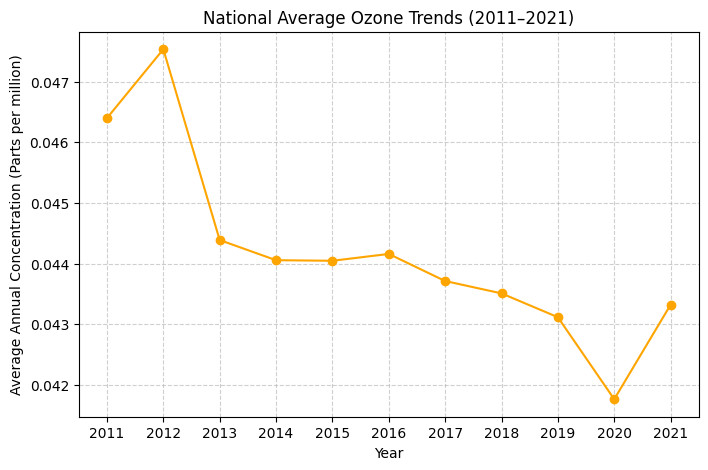

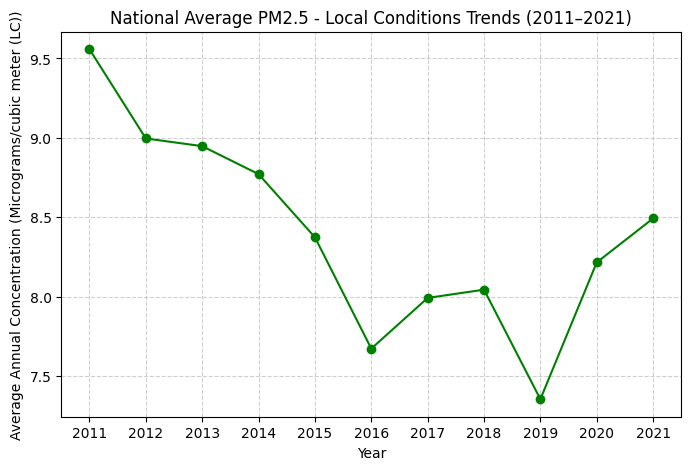

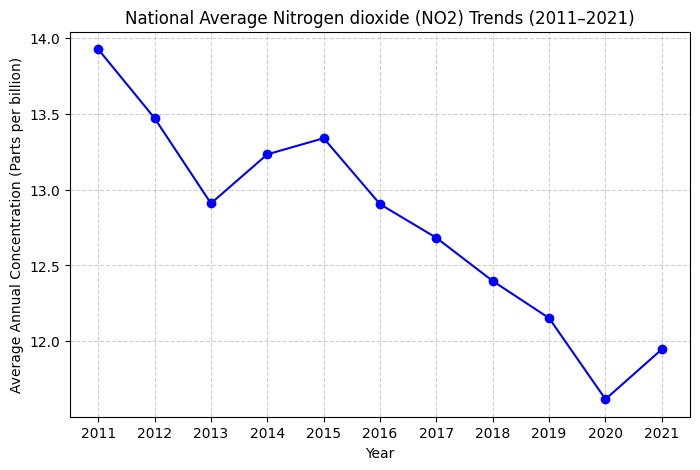

In [ ]:
df_revised2 = df_revised.copy()

# plot national trands by year per pollutant
pollutants = ['Ozone', 'PM2.5 - Local Conditions', 'Nitrogen dioxide (NO2)']

colors = {
    'Ozone': 'orange',
    'PM2.5 - Local Conditions': 'green',
    'Nitrogen dioxide (NO2)': 'blue'
}

for pollutant in pollutants:
    subset = df_revised2[df_revised2['Parameter Name'] == pollutant]
    yearly_avg = subset.groupby('Year')['Arithmetic Mean'].mean().reset_index()

    plt.figure(figsize=(8,5))
    plt.plot(yearly_avg['Year'], yearly_avg['Arithmetic Mean'],
             marker='o', color=colors[pollutant])

    plt.title(f"National Average {pollutant} Trends (2011–2021)")
    plt.xlabel("Year")
    plt.ylabel(f"Average Annual Concentration ({subset['Units of Measure'].iloc[0]})")
    plt.xticks(yearly_avg['Year'])  # show every year explicitly
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.savefig(f"{pollutant.replace(' ', '_').replace('-', '').replace('(', '').replace(')', '')}_trend.png",
                dpi=300, bbox_inches="tight")
    plt.show()

Pollution trending down. Likely due to increasing government regulations over time https://www.epa.gov/air-trends/air-quality-national-summary

Decrease in pollutants during COVID 19 lockdown https://www.pnas.org/doi/10.1073/pnas.2006853117


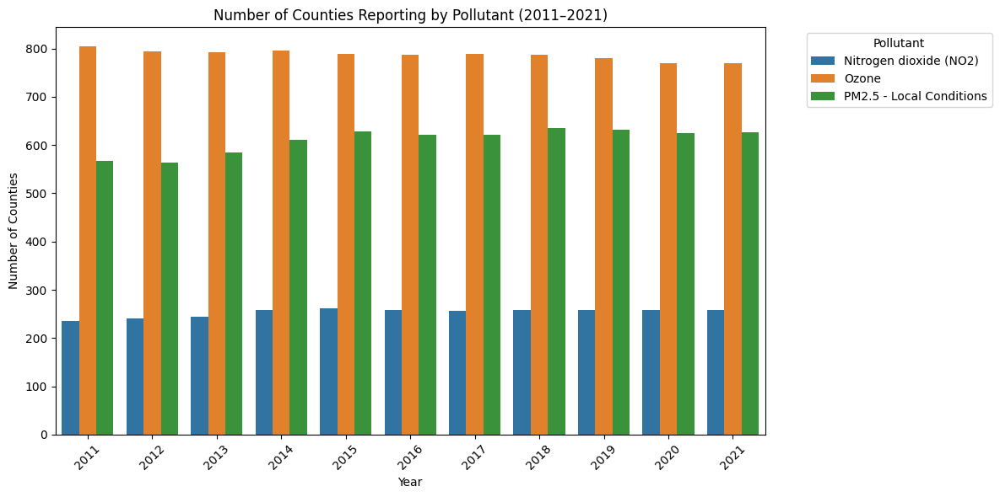

In [ ]:
# counties reporting each pollutant per year
summary = (
    df_revised2.groupby(["Year", "Parameter Name"])["FIPS"]
    .nunique()
    .reset_index(name="Num_Counties")
)

plt.figure(figsize=(12,6))
sns.barplot(data=summary, x="Year", y="Num_Counties", hue="Parameter Name")
plt.title("Number of Counties Reporting by Pollutant (2011–2021)")
plt.ylabel("Number of Counties")
plt.xticks(rotation=45)
plt.legend(title="Pollutant", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.savefig("counties_reporting_by_pollutant.png", dpi=300, bbox_inches="tight")
plt.show()

Most counties reporting data on ozone followed by PM2.5. Significantly fewer reporting NO2. PM2.5 will be focus for ranking since it is most associated with asthma and there are sufficient observations.

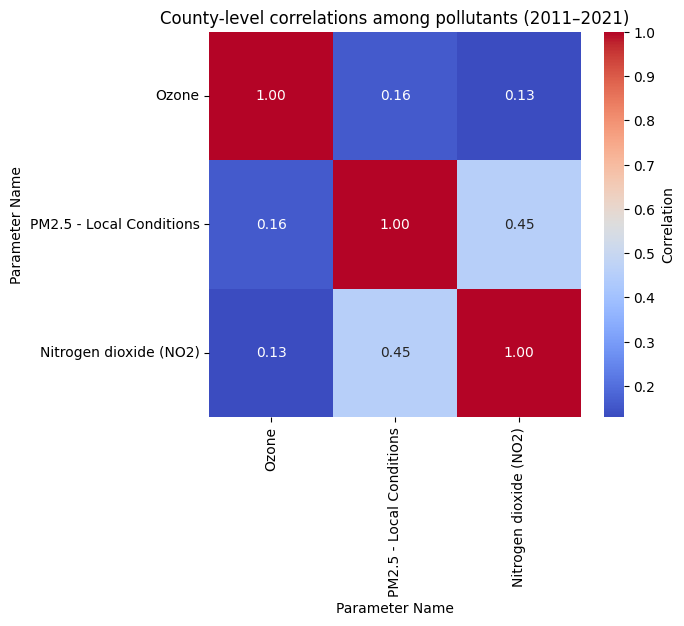

In [ ]:
# group by county, year, and pollutant, then take mean arithmetic mean
county_pollutants = (
    df_revised2
    .groupby(["FIPS", "Year", "Parameter Name"])["Arithmetic Mean"]
    .mean()
    .unstack()
    .reset_index()
)

# drop counties that don’t have all 3 pollutants for that year
county_pollutants = county_pollutants.dropna(subset=['Ozone', 'PM2.5 - Local Conditions', 'Nitrogen dioxide (NO2)'])

# calculate correlation matrix between pollutants
corr_matrix = county_pollutants[['Ozone', 'PM2.5 - Local Conditions', 'Nitrogen dioxide (NO2)']].corr()

# make heatmap
plt.figure(figsize=(6, 5))
sns.heatmap(
    corr_matrix,
    annot=True,    # show numbers
    fmt=".2f",     # round to 2 decimals
    cmap="coolwarm",
    cbar_kws={'label': 'Correlation'}
)
plt.title("County-level correlations among pollutants (2011–2021)")
plt.yticks(rotation=0)
plt.savefig("pollutant_correlation_heatmap.png", dpi=300, bbox_inches="tight")
plt.show()

This heatmap was created by aggregating the dataset at the county level, averaging pollutant values, and then calculating pairwise correlations among ozone, PM2.5, and NO₂ across all counties and years.

The results show that PM2.5 and NO₂ are moderately correlated (0.45), while ozone is only weakly correlated with either pollutant, suggesting they behave somewhat independently.

In [ ]:
# https://www2.census.gov/geo/tiger/GENZ2021/shp/

import zipfile
import os

zip_path = "/content/cb_2021_us_county_20m.zip"
extract_dir = "/content/county_shapefile"

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_dir)

shp_path = os.path.join(extract_dir, "cb_2021_us_county_20m.shp")
counties = gpd.read_file(shp_path)

counties.head()

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,NAME,NAMELSAD,STUSPS,STATE_NAME,LSAD,ALAND,AWATER,geometry
0,13,239,00350547,0500000US13239,13239,Quitman,Quitman County,GA,Georgia,06,391703076,24158295,"POLYGON ((-85.14183 31.83926, -85.11403 31.893..."
1,18,111,00450376,0500000US18111,18111,Newton,Newton County,IN,Indiana,06,1040539827,4349506,"POLYGON ((-87.52665 41.16609, -87.3938 41.1628..."
2,19,053,00465215,0500000US19053,19053,Decatur,Decatur County,IA,Iowa,06,1377569408,4138626,"POLYGON ((-94.0148 40.89703, -93.55654 40.8983..."
3,24,013,01696228,0500000US24013,24013,Carroll,Carroll County,MD,Maryland,06,1159355859,13112464,"POLYGON ((-77.21702 39.72022, -76.99932 39.720..."
4,29,155,00758532,0500000US29155,29155,Pemiscot,Pemiscot County,MO,Missouri,06,1275841039,53915406,"POLYGON ((-89.96131 36.3888, -89.75215 36.3864..."


In [ ]:
counties["FIPS"] = counties["STATEFP"] + counties["COUNTYFP"]
df_county2["FIPS"] = df_county2["FIPS"].astype(str).str.zfill(5)

gdf = counties.merge(df_county2, on="FIPS")

gdf.head()

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,NAME,NAMELSAD,STUSPS,STATE_NAME,LSAD,ALAND,AWATER,geometry,FIPS,Year,Parameter Name,Arithmetic Mean
0,24,013,01696228,0500000US24013,24013,Carroll,Carroll County,MD,Maryland,06,1159355859,13112464,"POLYGON ((-77.21702 39.72022, -76.99932 39.720...",24013,2011,Ozone,0.048609
1,24,013,01696228,0500000US24013,24013,Carroll,Carroll County,MD,Maryland,06,1159355859,13112464,"POLYGON ((-77.21702 39.72022, -76.99932 39.720...",24013,2012,Ozone,0.050515
2,24,013,01696228,0500000US24013,24013,Carroll,Carroll County,MD,Maryland,06,1159355859,13112464,"POLYGON ((-77.21702 39.72022, -76.99932 39.720...",24013,2013,Ozone,0.046792
3,24,013,01696228,0500000US24013,24013,Carroll,Carroll County,MD,Maryland,06,1159355859,13112464,"POLYGON ((-77.21702 39.72022, -76.99932 39.720...",24013,2014,Ozone,0.047230
4,24,013,01696228,0500000US24013,24013,Carroll,Carroll County,MD,Maryland,06,1159355859,13112464,"POLYGON ((-77.21702 39.72022, -76.99932 39.720...",24013,2015,Ozone,0.046988


/usr/local/lib/python3.12/dist-packages/geopandas/geodataframe.py:1968: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/tmp/ipython-input-876014579.py:25: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(prop={'size':8})


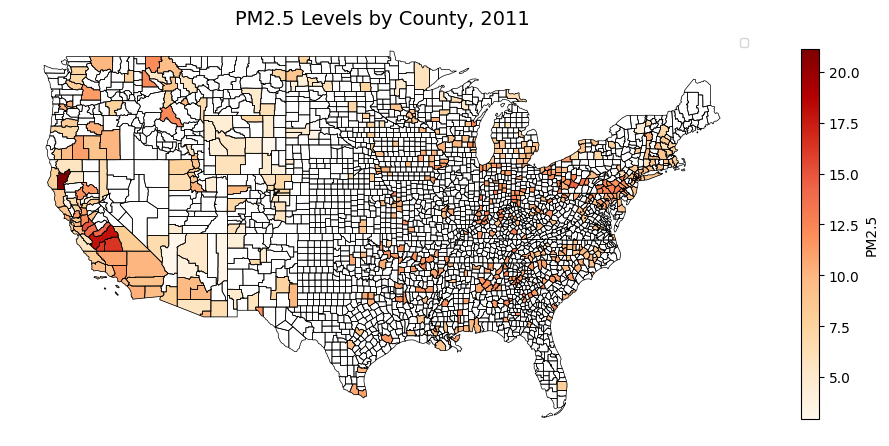

/tmp/ipython-input-876014579.py:25: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(prop={'size':8})


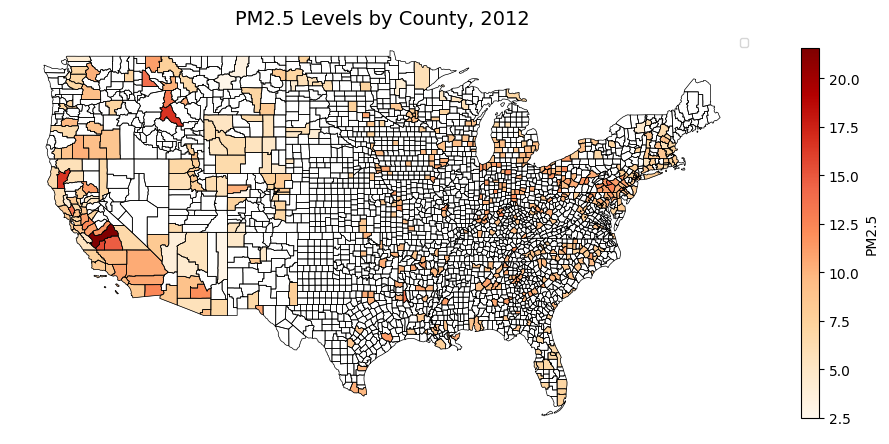

/tmp/ipython-input-876014579.py:25: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(prop={'size':8})


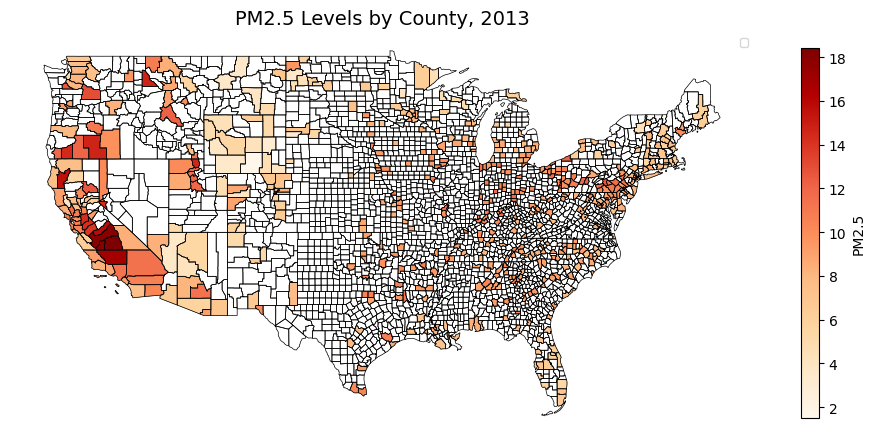

/tmp/ipython-input-876014579.py:25: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(prop={'size':8})


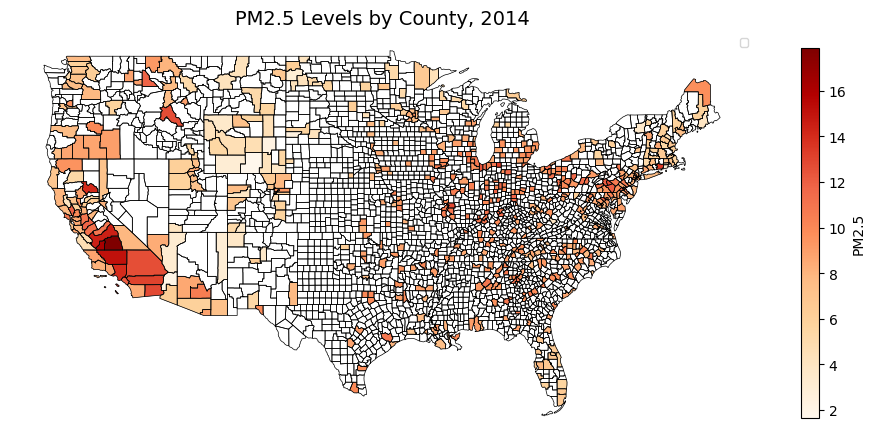

/tmp/ipython-input-876014579.py:25: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(prop={'size':8})


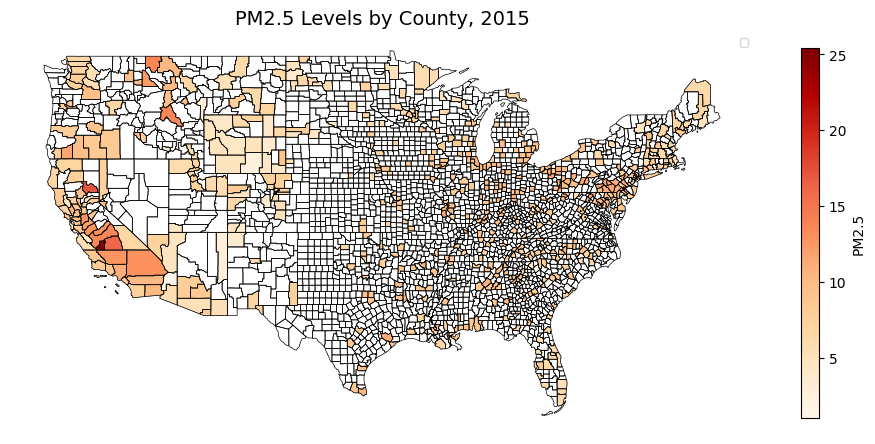

/tmp/ipython-input-876014579.py:25: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(prop={'size':8})


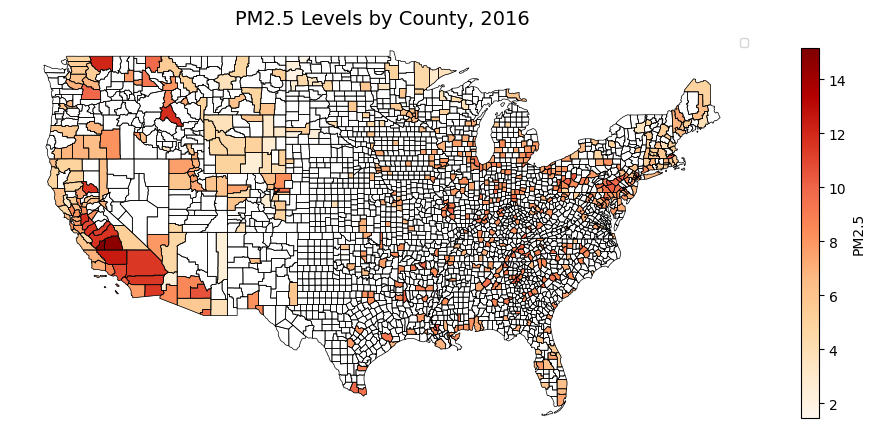

/tmp/ipython-input-876014579.py:25: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(prop={'size':8})


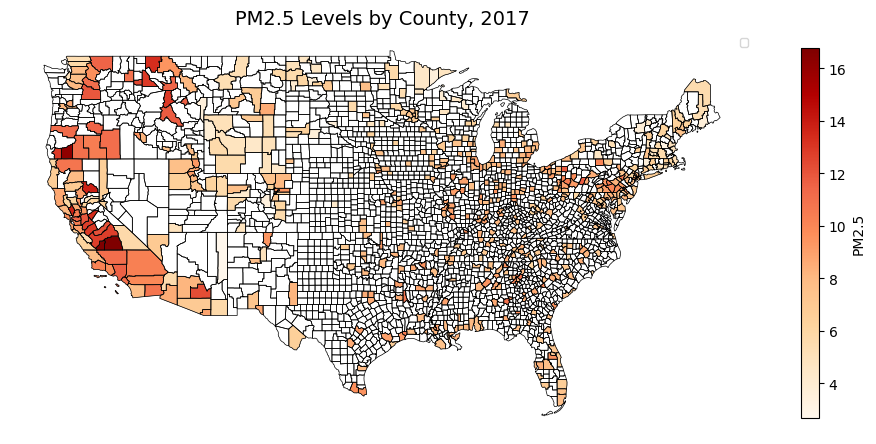

/tmp/ipython-input-876014579.py:25: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(prop={'size':8})


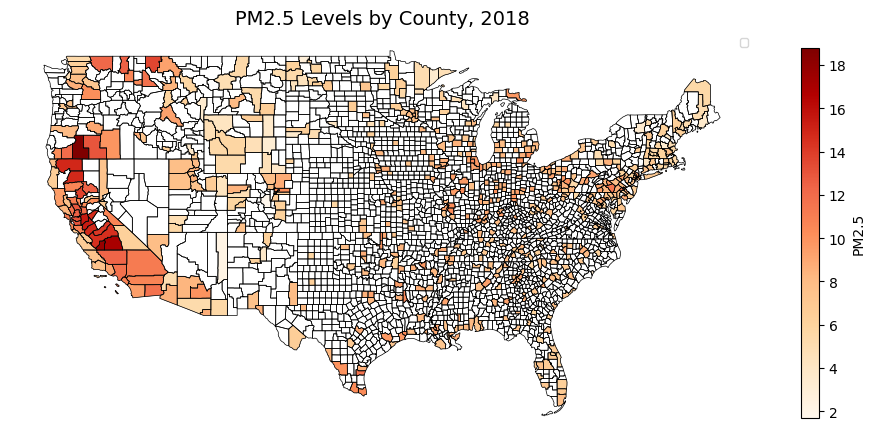

/tmp/ipython-input-876014579.py:25: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(prop={'size':8})


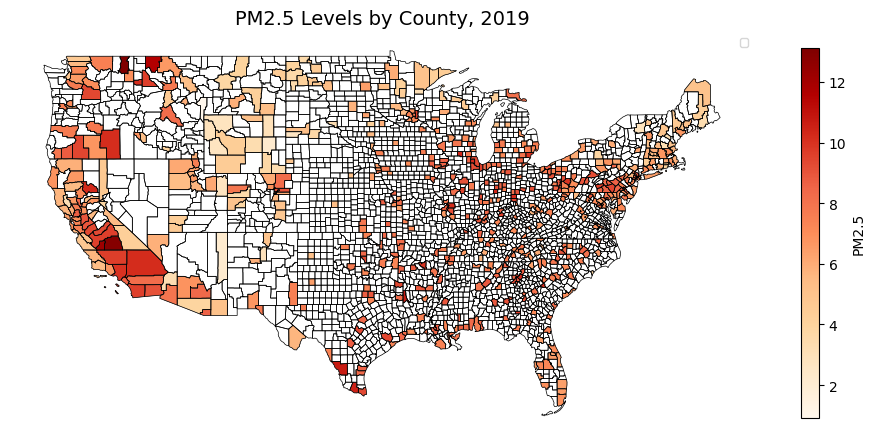

/tmp/ipython-input-876014579.py:25: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(prop={'size':8})


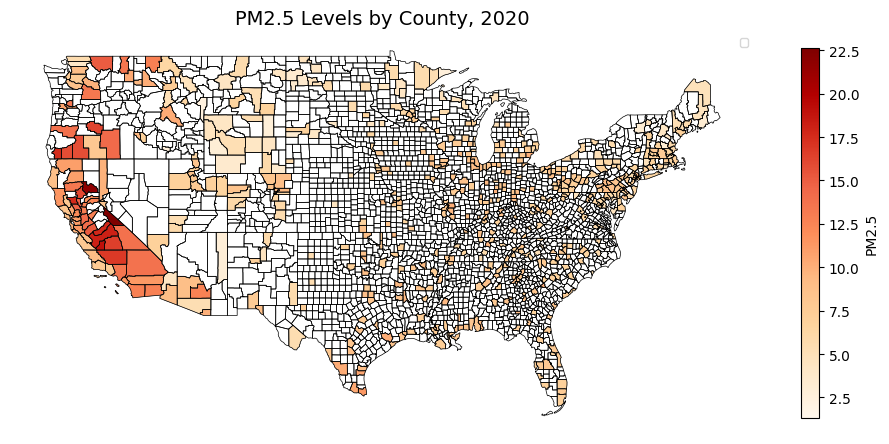

/tmp/ipython-input-876014579.py:25: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(prop={'size':8})


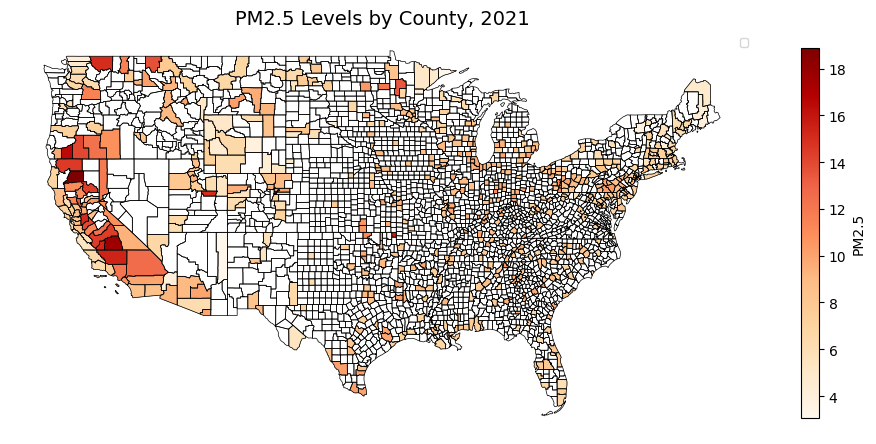

In [ ]:
contiguous = counties[~counties["STATEFP"].isin(["02","15","72"])]

contiguous["FIPS"] = contiguous["STATEFP"] + contiguous["COUNTYFP"]
df_county2["FIPS"] = df_county2["FIPS"].astype(str).str.zfill(5)

gdf = contiguous.merge(df_county2, on="FIPS")

gdf_pm25 = gdf[gdf["Parameter Name"] == "PM2.5 - Local Conditions"]

years = sorted(gdf_pm25["Year"].unique())

for year in years:
    subset = gdf_pm25[gdf_pm25["Year"] == year]
    fig, ax = plt.subplots(1, 1, figsize=(12, 8))
    contiguous.boundary.plot(ax=ax, linewidth=0.5, color="black")
    subset.plot(column="Arithmetic Mean",
                cmap="OrRd",
                linewidth=0.2,
                ax=ax,
                edgecolor="0.4",
                legend=True,
                legend_kwds={'shrink': 0.6, 'label': "PM2.5"})
    ax.set_title(f"PM2.5 Levels by County, {year}", fontsize=14)
    ax.axis("off")
    plt.legend(prop={'size':8})

    if year == 2021:
      plt.savefig("pm25_2021.png", dpi=300, bbox_inches="tight")

    plt.show()

import warnings
warnings.filterwarnings("ignore", message="No artists with labels found to put in legend")


In [ ]:
total_counties = contiguous["FIPS"].nunique()

coverage = gdf_pm25.groupby("Year")["FIPS"].nunique().reset_index(name="Counties_with_data")
coverage["Total_counties"] = total_counties
coverage["Coverage_percent"] = (coverage["Counties_with_data"] / total_counties * 100).round(2)

coverage

,Year,Counties_with_data,Total_counties,Coverage_percent
0,2011,547,3108,17.60
1,2012,544,3108,17.50
2,2013,567,3108,18.24
3,2014,593,3108,19.08
4,2015,611,3108,19.66
5,2016,604,3108,19.43
6,2017,604,3108,19.43
7,2018,618,3108,19.88
8,2019,616,3108,19.82
9,2020,607,3108,19.53


In 2021, 20% of U.S. counties reported PM2.5 levels. Coverage was concentrated in urban and metropolitan counties, while most rural counties in the Great Plains, Mountain West, and South had no data. The highest PM2.5 levels appeared in California and parts of the West, consistent with wilffire smoke and dense cities. Moderate levels were observed in parts of Midwest and Northeast.

In [ ]:
asthma = pd.read_csv("crude_asthma_2011_2021.csv")
asthma["CountyFIPS"] = asthma["CountyFIPS"].astype(str).str.zfill(5)

merged = gdf_pm25.merge(asthma, left_on=["FIPS","Year"], right_on=["CountyFIPS","Year"], how="left")

url_2020 = "https://www2.census.gov/programs-surveys/popest/datasets/2010-2020/counties/totals/co-est2020-alldata.csv"
pop_2020 = pd.read_csv(url_2020, dtype={'STATE': str, 'COUNTY': str}, encoding="latin1")
pop_2020['STATE'] = pop_2020['STATE'].str.zfill(2)
pop_2020['COUNTY'] = pop_2020['COUNTY'].str.zfill(3)
pop_2020['FIPS'] = pop_2020['STATE'] + pop_2020['COUNTY']
pop_long_2020 = pop_2020.melt(
    id_vars=['FIPS'],
    value_vars=[f'POPESTIMATE{yr}' for yr in range(2011,2021)],
    var_name='Year',
    value_name='Population'
)
pop_long_2020['Year'] = pop_long_2020['Year'].str.replace('POPESTIMATE', '').astype(int)

url_2021 = "https://www2.census.gov/programs-surveys/popest/datasets/2020-2021/counties/totals/co-est2021-alldata.csv"
pop_2021 = pd.read_csv(url_2021, dtype={'STATE': str, 'COUNTY': str}, encoding="latin1")
pop_2021['STATE'] = pop_2021['STATE'].str.zfill(2)
pop_2021['COUNTY'] = pop_2021['COUNTY'].str.zfill(3)
pop_2021['FIPS'] = pop_2021['STATE'] + pop_2021['COUNTY']
pop_long_2021 = pop_2021.melt(
    id_vars=['FIPS'],
    value_vars=['POPESTIMATE2021'],
    var_name='Year',
    value_name='Population'
)
pop_long_2021['Year'] = pop_long_2021['Year'].str.replace('POPESTIMATE', '').astype(int)

pop_long = pd.concat([pop_long_2020, pop_long_2021], ignore_index=True)

merged = merged.merge(pop_long, on=['FIPS','Year'], how='left')
merged['ER_rate_per_100k'] = merged['Value'] * 10

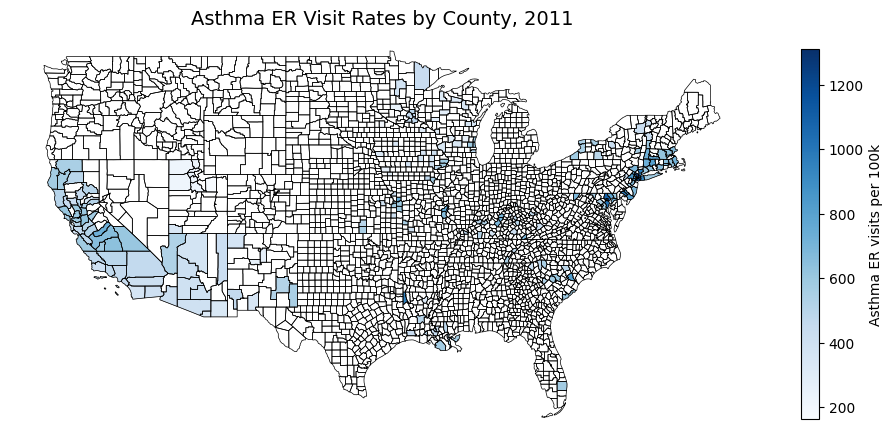

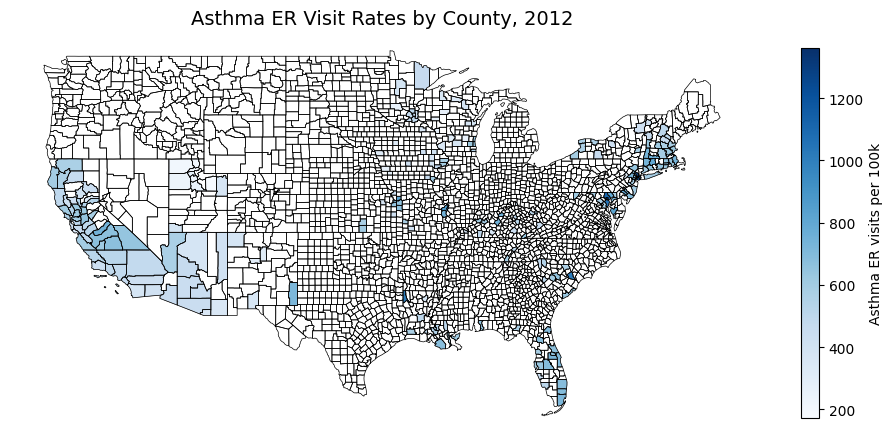

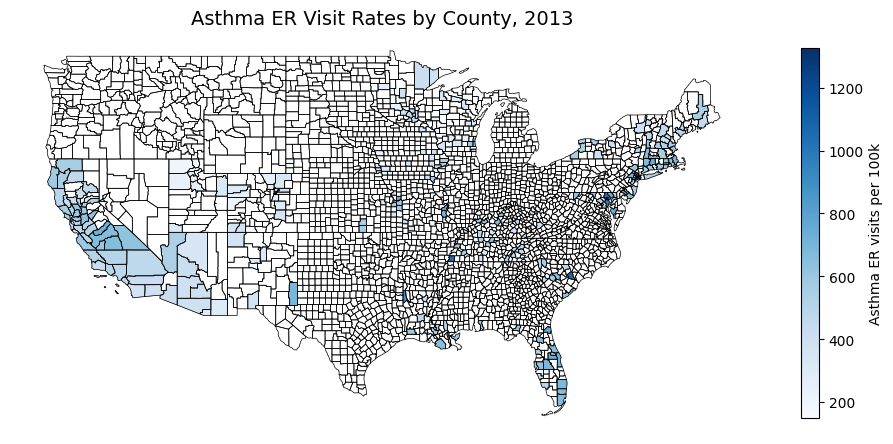

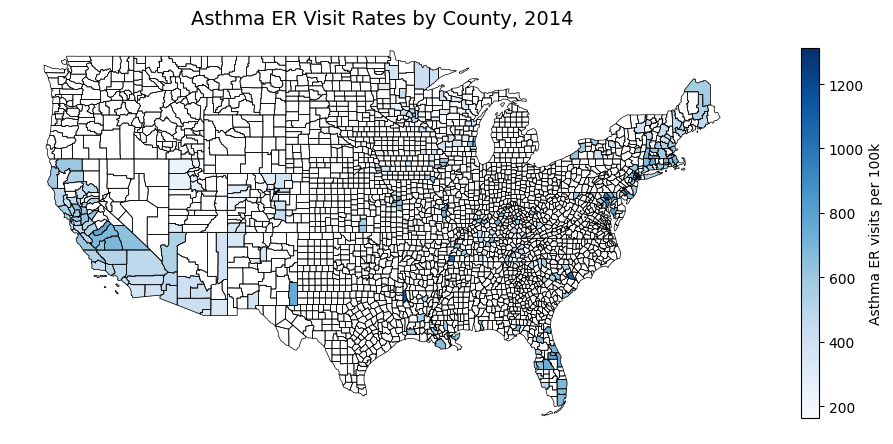

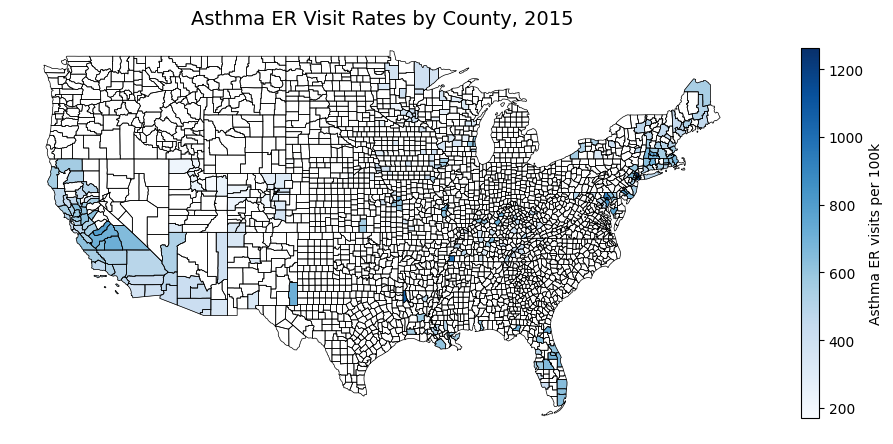

...

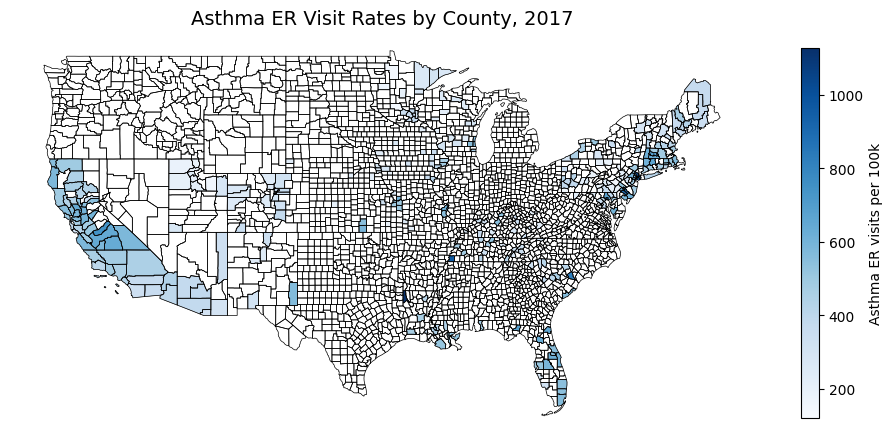

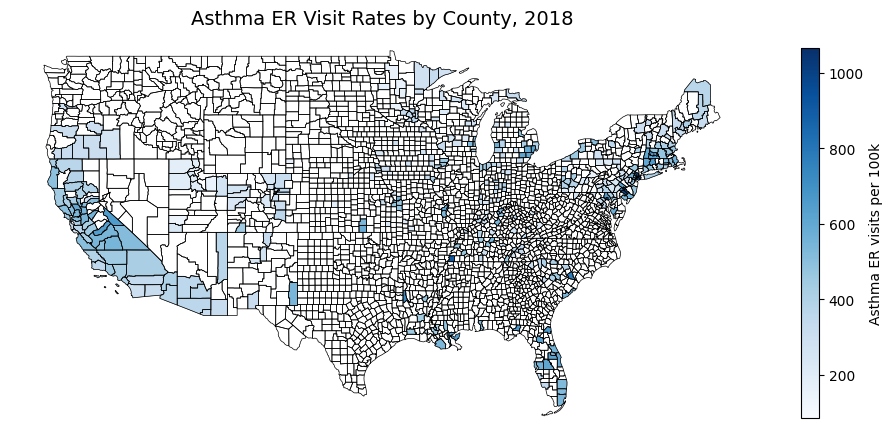

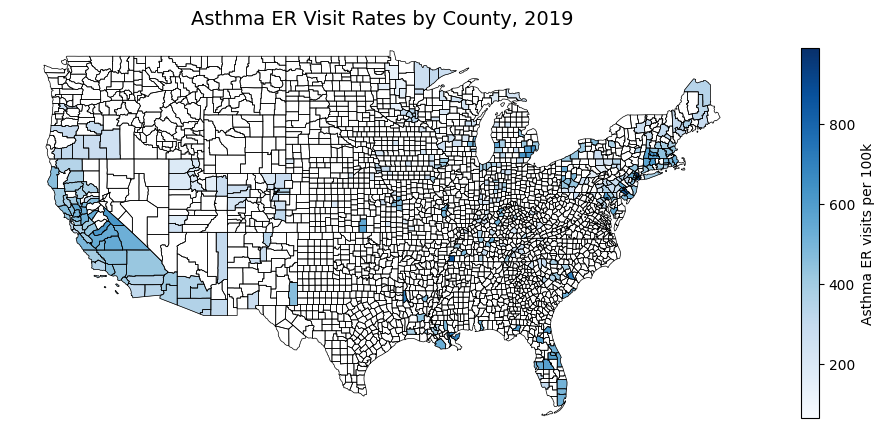

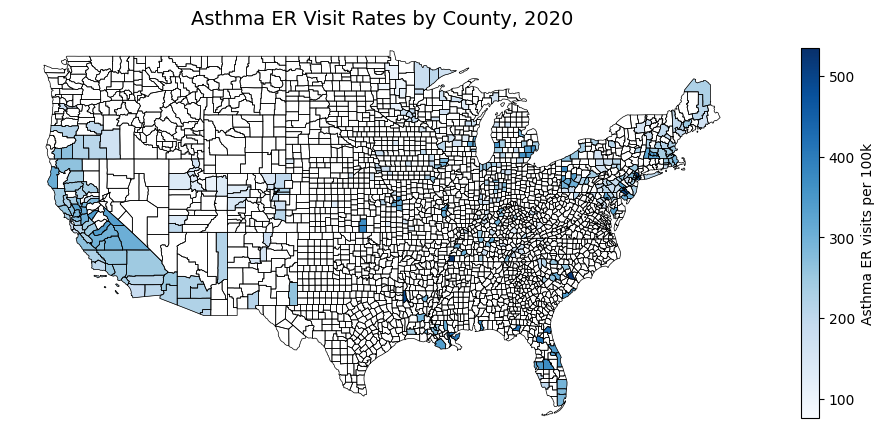

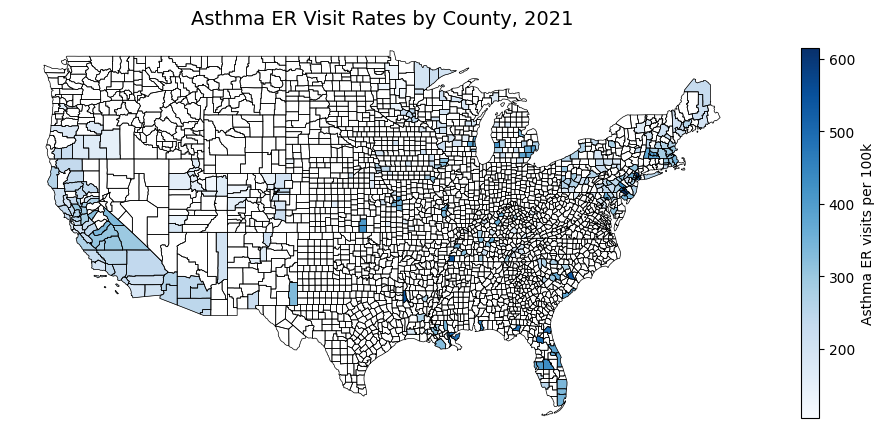

In [ ]:

for year in sorted(merged["Year"].unique()):
    subset = merged[merged["Year"] == year]
    fig, ax = plt.subplots(1, 1, figsize=(12, 8))
    contiguous.boundary.plot(ax=ax, linewidth=0.5, color="black")
    subset.plot(column="ER_rate_per_100k",
                cmap="Blues",
                linewidth=0.2,
                ax=ax,
                edgecolor="0.4",
                legend=True,
                legend_kwds={'shrink':0.6, 'label':'Asthma ER visits per 100k'})
    ax.set_title(f"Asthma ER Visit Rates by County, {year}", fontsize=14)
    ax.axis("off")
    if year == 2021:
      plt.savefig("asthma_er_2021.png", dpi=300, bbox_inches="tight")
    plt.show()

In [ ]:
total_counties = contiguous["FIPS"].nunique()

coverage_asthma = asthma.groupby("Year")["CountyFIPS"].nunique().reset_index(name="Counties_with_asthma")
coverage_asthma["Total_counties"] = total_counties
coverage_asthma["Coverage_percent"] = (coverage_asthma["Counties_with_asthma"] / total_counties * 100).round(2)

coverage_asthma

,Year,Counties_with_asthma,Total_counties,Coverage_percent
0,2011,1169,3108,37.61
1,2012,1179,3108,37.93
2,2013,1336,3108,42.99
3,2014,1336,3108,42.99
4,2015,1290,3108,41.51
5,2016,1403,3108,45.14
6,2017,1403,3108,45.14
7,2018,1614,3108,51.93
8,2019,1614,3108,51.93
9,2020,1606,3108,51.67


In 2021, asthma ER visits were reported for 49% of U.S. counties, but the reporting counties were scattered rather than clustered. Hotspots were concentrated in central and southern California. Elevated rates were also found in Nevada, Arizona, upper Midwest, and Northeast. These regions reported much higher asthma ER visits per 100,000 people compared to surrounding areas, though coverage limited the national picture.

/tmp/ipython-input-1599167537.py:4: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  subset["centroid"] = subset.geometry.centroid


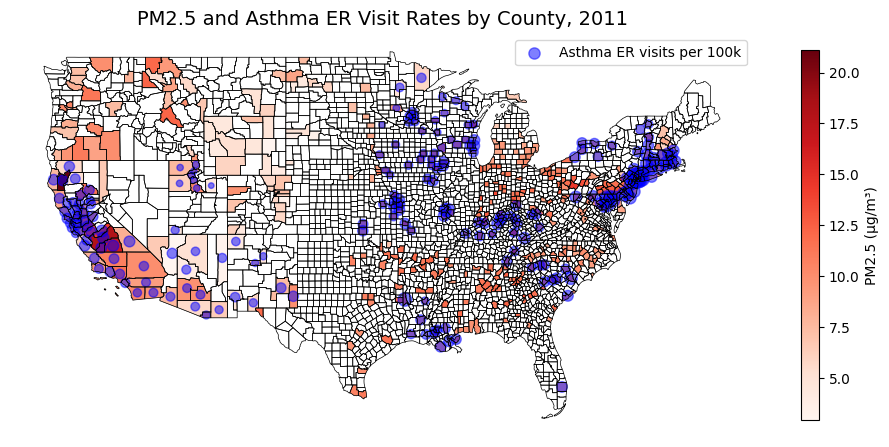

/tmp/ipython-input-1599167537.py:4: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  subset["centroid"] = subset.geometry.centroid


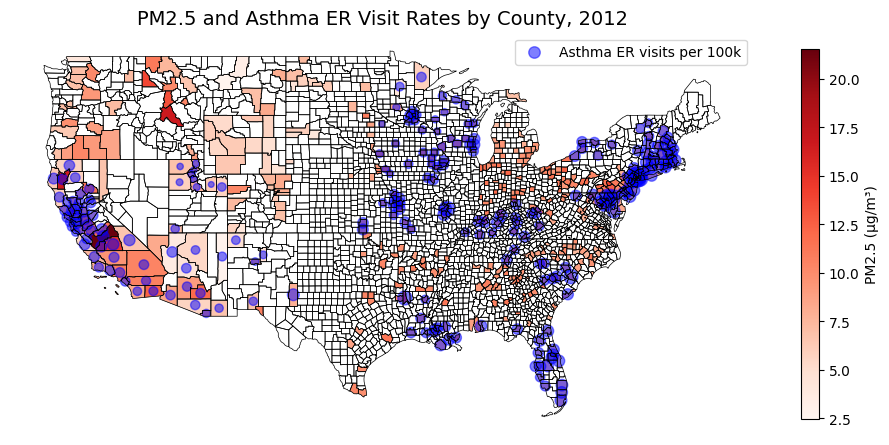

/tmp/ipython-input-1599167537.py:4: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  subset["centroid"] = subset.geometry.centroid


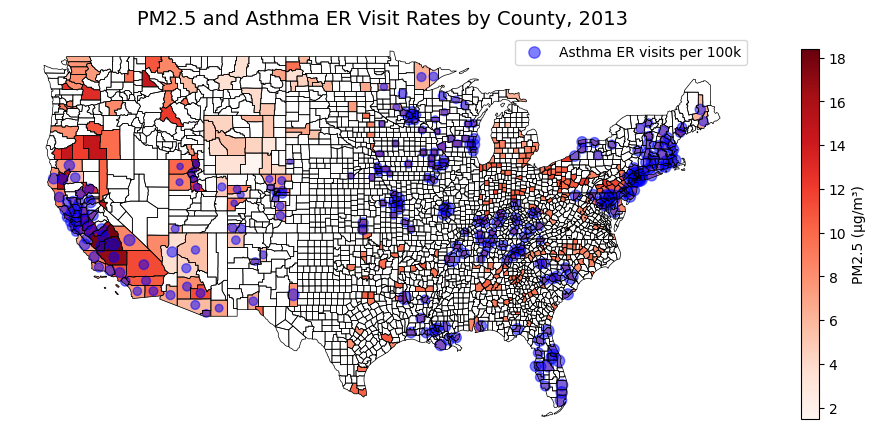

/tmp/ipython-input-1599167537.py:4: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  subset["centroid"] = subset.geometry.centroid


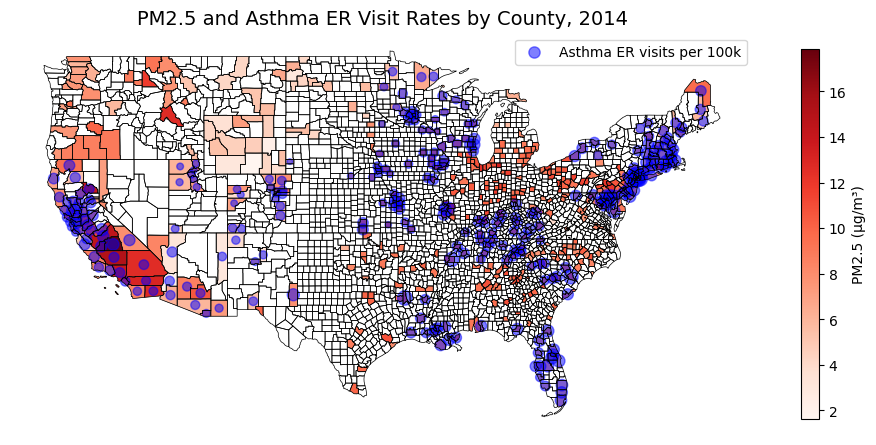

/tmp/ipython-input-1599167537.py:4: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  subset["centroid"] = subset.geometry.centroid


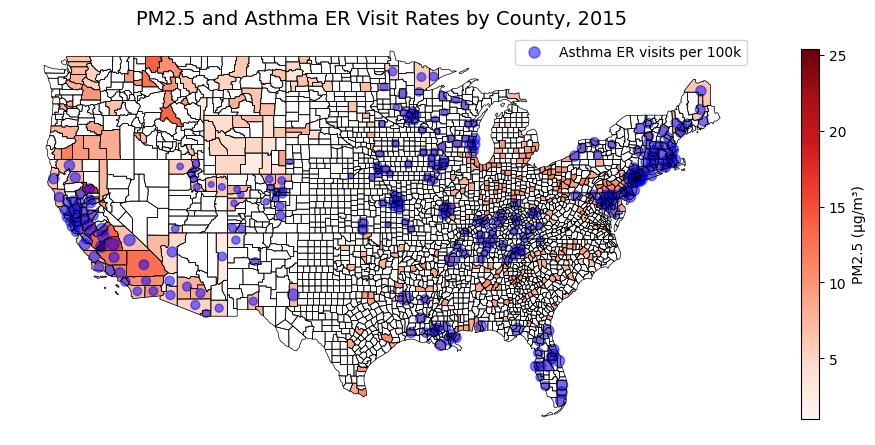

/tmp/ipython-input-1599167537.py:4: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  subset["centroid"] = subset.geometry.centroid


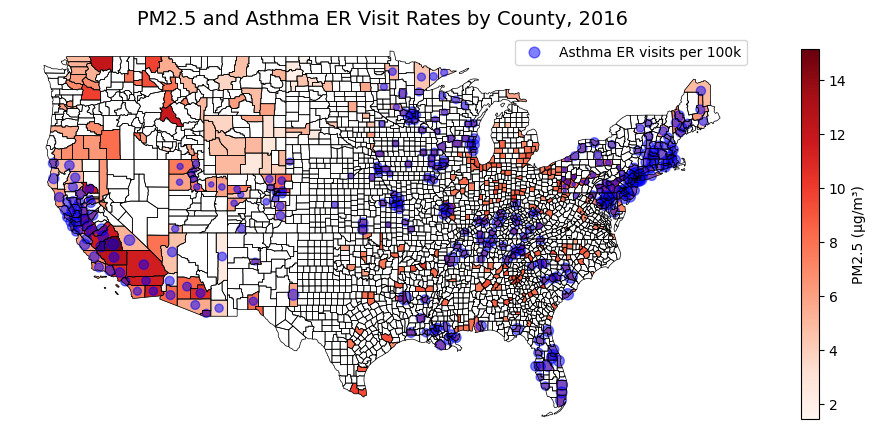

/tmp/ipython-input-1599167537.py:4: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  subset["centroid"] = subset.geometry.centroid


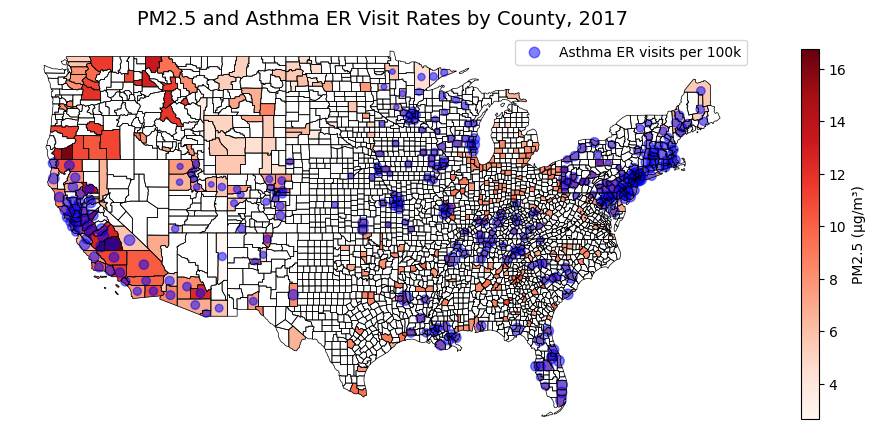

/tmp/ipython-input-1599167537.py:4: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  subset["centroid"] = subset.geometry.centroid


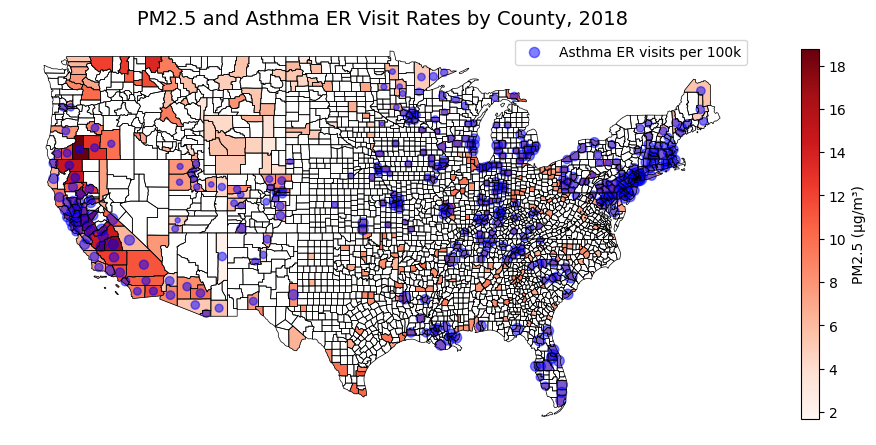

/tmp/ipython-input-1599167537.py:4: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  subset["centroid"] = subset.geometry.centroid


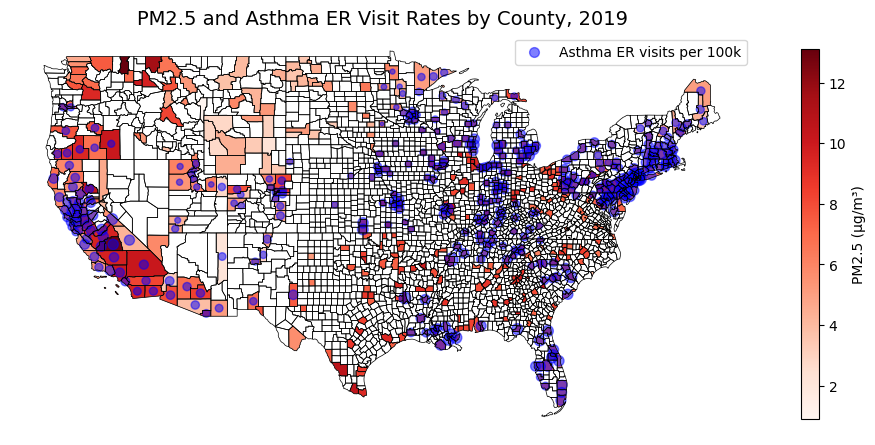

/tmp/ipython-input-1599167537.py:4: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  subset["centroid"] = subset.geometry.centroid


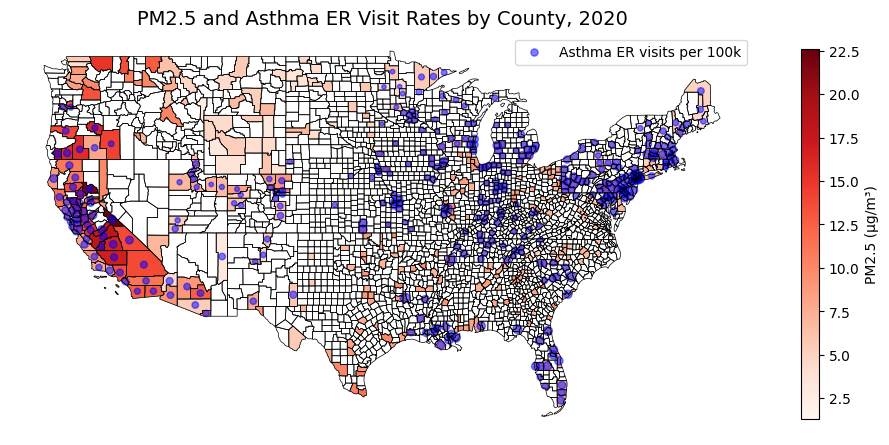

/tmp/ipython-input-1599167537.py:4: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  subset["centroid"] = subset.geometry.centroid


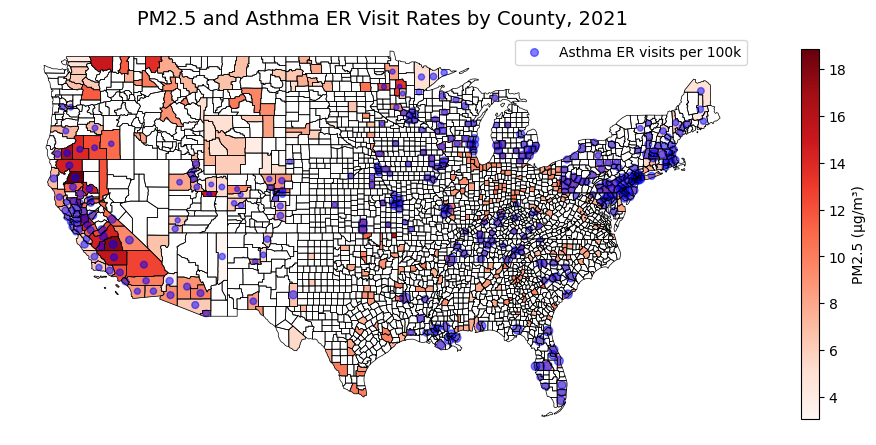

In [ ]:
for year in sorted(merged["Year"].unique()):
    subset = merged[merged["Year"] == year].copy()
    subset = subset[subset.geometry.notnull()]
    subset["centroid"] = subset.geometry.centroid

    fig, ax = plt.subplots(1, 1, figsize=(12, 8))
    contiguous.boundary.plot(ax=ax, linewidth=0.5, color="black")
    subset.plot(column="Arithmetic Mean",
                cmap="Reds",
                linewidth=0.2,
                ax=ax,
                edgecolor="0.4",
                legend=True,
                legend_kwds={'shrink':0.6, 'label':'PM2.5 (µg/m³)'})
    subset.set_geometry("centroid").plot(ax=ax,
                markersize=subset["ER_rate_per_100k"].fillna(0) / 10,
                color="blue",
                alpha=0.5,
                marker="o",
                label="Asthma ER visits per 100k")
    ax.set_title(f"PM2.5 and Asthma ER Visit Rates by County, {year}", fontsize=14)
    ax.axis("off")
    ax.legend()
    if year == 2021:
      plt.savefig("pm25_asthma_overlay_2021.png", dpi=300, bbox_inches="tight")
    plt.show()


The combined 2021 map shows county-level PM2.5 concentrations as shaded red backgrounds with asthma ER visit rates per 100,000 people overlaid as blue circles. The highest PM2.5 levels appear in California, especially the Central Valley and Southern California, while elevated levels are also present across parts of the Northeast and industrial Midwest. Asthma ER hotspots are most visible in California, Nevada, and scattered counties in the Upper Midwest and Northeast, where larger blue circles overlap with darker PM2.5 shading. This overlap highlights places where both pollution exposure and asthma burden are high, suggesting potential environmental health risks. At the same time, large regions of the Plains and rural South remain blank, reflecting limited asthma and PM2.5 reporting rather than absence of disease or pollution.

In [ ]:
# https://www.census.gov/geographies/reference-files/2020/demo/popest/2020-fips.html



In [ ]:
url = "https://www.countyhealthrankings.org/sites/default/files/media/document/analytic_data2021.csv"
chr = pd.read_csv(url, low_memory=False)
chr.columns[:50]

Index(['State FIPS Code', 'County FIPS Code', '5-digit FIPS Code',
       'State Abbreviation', 'Name', 'Release Year',
       'County Ranked (Yes=1/No=0)', 'Premature death raw value',
       'Premature death numerator', 'Premature death denominator',
       'Premature death CI low', 'Premature death CI high',
       'Premature death flag (0 = No Flag/1=Unreliable/2=Suppressed)',
       'Premature death (AIAN)', 'Premature death CI low (AIAN)',
       'Premature death CI high (AIAN)',
       'Premature death flag (AIAN) (. = No Flag/1=Unreliable/2=Suppressed)',
       'Premature death (Asian/Pacific Islander)',
       'Premature death CI low (Asian/Pacific Islander)',
       'Premature death CI high (Asian/Pacific Islander)',
       'Premature death flag (Asian/Pacific Islander) (. = No Flag/1=Unreliable/2=Suppressed)',
       'Premature death (Black)', 'Premature death CI low (Black)',
       'Premature death CI high (Black)',
       'Premature death flag (Black) (. = No Flag/1=Unrel

In [ ]:
[col for col in chr.columns if "income" in col.lower() or "poverty" in col.lower()
 or "population" in col.lower() or "hispanic" in col.lower()
 or "black" in col.lower() or "white" in col.lower()
 or "college" in col.lower() or "age" in col.lower()]

['Premature death (Black)',
 'Premature death CI low (Black)',
 'Premature death CI high (Black)',
 'Premature death flag (Black) (. = No Flag/1=Unreliable/2=Suppressed)',
 'Premature death (Hispanic)',
 'Premature death CI low (Hispanic)',
 'Premature death CI high (Hispanic)',
 'Premature death flag (Hispanic) (. = No Flag/1=Unreliable/2=Suppressed)',
 'Premature death (White)',
 'Premature death CI low (White)',
 'Premature death CI high (White)',
 'Premature death flag (White) (. = No Flag/1=Unreliable/2=Suppressed)',
 'Low birthweight (Black)',
 'Low birthweight CI low (Black)',
 'Low birthweight CI high (Black)',
 'Low birthweight (Hispanic)',
 'Low birthweight CI low (Hispanic)',
 'Low birthweight CI high (Hispanic)',
 'Low birthweight (White)',
 'Low birthweight CI low (White)',
 'Low birthweight CI high (White)',
 'Teen births (Black)',
 'Teen births CI low (Black)',
 'Teen births CI high (Black)',
 'Teen births (Hispanic)',
 'Teen births CI low (Hispanic)',
 'Teen births CI h

In [ ]:
url = "https://www.countyhealthrankings.org/sites/default/files/media/document/analytic_data2021.csv"
chr = pd.read_csv(url, low_memory=False)

cols = [
    "5-digit FIPS Code", "State Abbreviation", "Name",
    "Population raw value",
    "% below 18 years of age raw value",
    "% 65 and older raw value",
    "% Non-Hispanic Black raw value",
    "% Hispanic raw value",
    "% Non-Hispanic White raw value",
    "Median household income raw value",
    "Children in poverty raw value",
    "Some college raw value",
    "Residential segregation - Black/White raw value"
]
df = chr[cols]

target_fips = ["06105","06031","06107","06019","49007","08093","04001","04012","36031","04015"]
subset = df[df["5-digit FIPS Code"].astype(str).isin(target_fips)]
subset.reset_index(drop=True, inplace=True)
subset

,5-digit FIPS Code,State Abbreviation,Name,Population raw value,% below 18 years of age raw value,% 65 and older raw value,% Non-Hispanic Black raw value,% Hispanic raw value,% Non-Hispanic White raw value,Median household income raw value,Children in poverty raw value,Some college raw value,Residential segregation - Black/White raw value
0,04001,AZ,Apache County,71887,0.2702157553,0.1576641117,0.0049522167,0.0658811746,0.179935176,35386,0.447,0.5113643072,54.207276368
1,04012,AZ,La Paz County,21108,0.1660981618,0.3975743794,0.0087644495,0.2833996589,0.5650938033,39407,0.326,0.3861328692,72.838953504
2,04015,AZ,Mohave County,212181,0.1666454584,0.3106310179,0.0110848756,0.1692847145,0.7674344074,49712,0.282,0.4784639984,63.181339485
3,06019,CA,Fresno County,999101,0.2821066138,0.1255478675,0.0463156378,0.5376633594,0.2863063894,56926,0.29,0.5563143429,47.330101773
4,06031,CA,Kings County,152940,0.2703216948,0.1047992677,0.0631751013,0.5525957892,0.3134431803,57297,0.223,0.5051268683,28.399456138
5,06105,CA,Trinity County,12285,0.1734635735,0.2828652829,0.0056980057,0.0738298738,0.8188848189,43881,0.253,0.6006573541,NaN
6,06107,CA,Tulare County,466195,0.304820944,0.1164555604,0.0123060093,0.6560001716,0.2766117183,56776,0.258,0.4787710585,60.106573503
7,08093,CO,Park County,18845,0.1500663306,0.2159724065,0.0087025736,0.0637834969,0.8906341205,77221,0.13,0.6293779404,NaN
8,36031,NY,Essex County,36885,0.1601735123,0.2426189508,0.02350549,0.0301477565,0.9225159279,55091,0.171,0.5575415129,NaN
9,49007,UT,Carbon County,20463,0.2562674095,0.1802277281,0.0047402629,0.1341934223,0.8288129795,52110,0.176,0.7409442409,NaN


County-level demographic and socioeconomic indicators were obtained from the County Health Rankings & Roadmaps 2021 Analytic Data file, which is provided at https://www.countyhealthrankings.org/sites/default/files/media/document/analytic_data2021.csv
. From this dataset, population size, age, race/ethnicity, education, income, poverty, and segregation were extracted for the top and bottom five counties ranked by PM2.5 pollution.

The demographic table shows clear contrasts between the top five most polluted counties (Trinity, Kings, Tulare, Fresno in California, and Carbon in Utah) and the bottom five cleanest counties (Park in Colorado, Apache, La Paz, and Mohave in Arizona, and Essex in New York). The more polluted counties tend to have higher proportions of residents identifying as Hispanic (e.g., Tulare 65.6% and Fresno 53.8%) and elevated child poverty rates (e.g., Fresno 29%, Tulare 25.8%).
Median household income is generally higher in the cleanest counties, such as Park, CO and Essex, NY, compared with counties like Trinity, CA. The share of residents with some college education is also somewhat lower in the polluted group, while Park, CO stands out with the highest rate at 62.9%. These patterns suggest that the cleaner counties are characterized by relatively higher income levels, lower poverty, and stronger educational attainment compared with the more polluted counties.

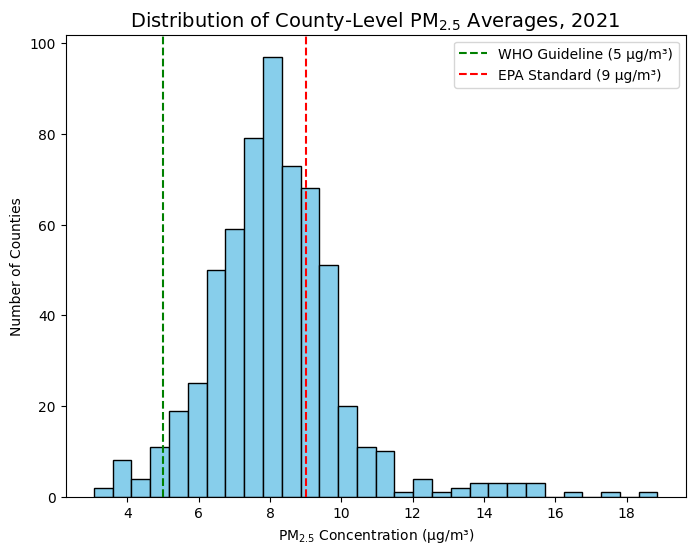

In [ ]:
pm25_2021 = gdf_pm25[gdf_pm25["Year"] == 2021]

plt.figure(figsize=(8,6))
plt.hist(pm25_2021["Arithmetic Mean"], bins=30, color="skyblue", edgecolor="black")
plt.axvline(5, color="green", linestyle="--", label="WHO Guideline (5 µg/m³)")
plt.axvline(9, color="red", linestyle="--", label="EPA Standard (9 µg/m³)")
plt.title("Distribution of County-Level PM$_{2.5}$ Averages, 2021", fontsize=14)
plt.xlabel("PM$_{2.5}$ Concentration (µg/m³)")
plt.ylabel("Number of Counties")
plt.legend()
plt.savefig("pm25_histogram_2021.png", dpi=300, bbox_inches="tight")
plt.show()